In [58]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# Import the library
from matplotlib_venn import venn3
from matplotlib.pyplot import figure
import matplotlib.patches as mpatches

import scipy.stats as stats
import itertools

In [19]:
X_train = pd.read_csv('X_train_prepared.csv')
y_train = pd.read_csv('y_train.csv')

In [20]:
train = X_train.merge(y_train,on=X_train.index).drop('key_0',axis=1)

In [40]:
categorical_columns = list(X_train.select_dtypes('object').columns)
categorical_columns.extend(['Dependent_count','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon'])
print("Categorical Features: ",categorical_columns)
print()
numerical_columns = list(X_train.select_dtypes(exclude=['object']).columns)
numerical_columns = [i for i in numerical_columns if i not in ('Dependent_count','Attrition_Flag','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon','missing_marital_status','missing_education_level','missing_income_category')]
print("Numerical Features: ", numerical_columns)
print()
print('Target Variable: Attrition_Flag')

# includes attrition
numerical_columns_attrition = list(X_train.select_dtypes(exclude=['object']).columns)
numerical_columns_attrition = [i for i in numerical_columns if i not in ('Dependent_count','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon')]

Categorical Features:  ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']

Numerical Features:  ['Customer_Age', 'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

Target Variable: Attrition_Flag


In [41]:
missing_ms = []
alpha = .05
zero = X_train[X_train['missing_marital_status']==0]
one = X_train[X_train['missing_marital_status']==1]

for pair in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train['missing_marital_status'], X_train[pair]))[1]
    if p_val < alpha:
        missing_ms.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with missing_marital_status according to Chi-Squared Test: ', missing_ms)
missing_ic = []
alpha = .05

for pair in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train['missing_income_category'], X_train[pair]))[1]
    if p_val < alpha:
        missing_ic.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with missing_income_category according to Chi-Squared Test: ', missing_ic)

missing_el = []
alpha = .05

for pair in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train['missing_education_level'], X_train[pair]))[1]
    if p_val < alpha:
        missing_el.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with missing_education_level according to Chi-Squared Test: ', missing_el)

Categorical Variables associated with missing_marital_status according to Chi-Squared Test:  ['Card_Category', 'Dependent_count', 'Total_Relationship_Count', 'Contacts_Count_12_mon']
Categorical Variables associated with missing_income_category according to Chi-Squared Test:  ['Gender', 'Education_Level', 'Months_Inactive_12_mon']
Categorical Variables associated with missing_education_level according to Chi-Squared Test:  []


In [23]:
# Observations



In [78]:
alpha = .05
for num in numerical_columns:
    combined_stat = stats.shapiro(X_train[num])[1]
    if combined_stat < alpha:
        print( num, 'Distribution IS NOT normally distributed with p-value of ', combined_stat)
    else:
        print(num, 'Distribution IS normally distributed with p-value of ', combined_stat)
    print()

Customer_Age Distribution IS NOT normally distributed with p-value of  6.159138411961085e-14

Months_on_book Distribution IS NOT normally distributed with p-value of  1.6636292854664112e-34

Credit_Limit Distribution IS NOT normally distributed with p-value of  0.0

Total_Revolving_Bal Distribution IS NOT normally distributed with p-value of  0.0

Avg_Open_To_Buy Distribution IS NOT normally distributed with p-value of  0.0

Total_Amt_Chng_Q4_Q1 Distribution IS NOT normally distributed with p-value of  0.0

Total_Trans_Amt Distribution IS NOT normally distributed with p-value of  0.0

Total_Trans_Ct Distribution IS NOT normally distributed with p-value of  1.9507601466585252e-29

Total_Ct_Chng_Q4_Q1 Distribution IS NOT normally distributed with p-value of  0.0

Avg_Utilization_Ratio Distribution IS NOT normally distributed with p-value of  0.0



C:\Users\m2mar\anaconda3\lib\site-packages\scipy\stats\morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


# 2.2 Univariate Analysis (Descriptive)

In [42]:
not_churned = train[train['Attrition_Flag'] == 0]
churned = train[train['Attrition_Flag'] == 1]
display(not_churned.describe())
churned.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,missing_marital_status,missing_education_level,missing_income_category,Attrition_Flag
count,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.000000,6783.0
mean,46.322719,2.340410,35.928793,3.916556,2.274215,2.355890,8801.834867,1257.418841,7544.416025,0.772034,4642.498157,68.593543,0.743351,0.293168,0.070618,0.149344,0.108949,0.0
std,8.049231,1.300307,7.993755,1.528881,1.020576,1.087372,9096.845789,760.994332,9095.598358,0.218234,3513.432128,22.886841,0.229982,0.271770,0.256204,0.356453,0.311598,0.0
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,15.000000,0.256000,816.000000,11.000000,0.028000,0.000000,0.000000,0.000000,0.000000,0.0
25%,41.000000,1.000000,31.000000,3.000000,1.000000,2.000000,2636.000000,797.500000,1222.500000,0.642500,2347.500000,54.000000,0.615000,0.054000,0.000000,0.000000,0.000000,0.0
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4752.000000,1372.000000,3572.000000,0.742000,4093.000000,71.000000,0.722000,0.207000,0.000000,0.000000,0.000000,0.0
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11453.500000,1812.000000,10178.000000,0.860000,4775.000000,82.000000,0.833000,0.522000,0.000000,0.000000,0.000000,0.0
max,73.000000,5.000000,56.000000,6.000000,6.000000,5.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,138.000000,3.714000,0.994000,1.000000,1.000000,1.000000,0.0


,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,missing_marital_status,missing_education_level,missing_income_category,Attrition_Flag
count,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.0
mean,46.622155,2.401366,36.089530,3.270865,2.697269,2.968892,8150.763050,669.787557,7480.975493,0.695397,3050.029590,44.811836,0.554547,0.161480,0.079666,0.163126,0.117602,1.0
std,7.682175,1.262952,7.839866,1.581091,0.920619,1.102122,9149.096857,926.570113,9166.086507,0.213773,2267.949334,14.589845,0.229715,0.264602,0.270878,0.369621,0.322259,0.0
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,10.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,41.000000,2.000000,32.000000,2.000000,2.000000,2.000000,2111.750000,0.000000,1600.250000,0.545500,1900.500000,37.000000,0.400000,0.000000,0.000000,0.000000,0.000000,1.0
50%,46.000000,2.000000,36.000000,3.000000,3.000000,3.000000,4159.500000,0.000000,3468.500000,0.701500,2312.500000,43.000000,0.529000,0.000000,0.000000,0.000000,0.000000,1.0
75%,52.000000,3.000000,40.000000,5.000000,3.000000,4.000000,9915.750000,1330.000000,9373.500000,0.855750,2737.500000,51.000000,0.691500,0.227750,0.000000,0.000000,0.000000,1.0
max,68.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,1.411000,10583.000000,94.000000,2.500000,0.995000,1.000000,1.000000,1.000000,1.0


## 2.2.1 Categorical Data

In [44]:
missing_columns = ['missing_marital_status','missing_education_level','missing_income_category']
categorical_columns.extend(missing_columns)
categorical_columns

['Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category',
 'Dependent_count',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'missing_marital_status',
 'missing_education_level',
 'missing_income_category']

### Frequency Count

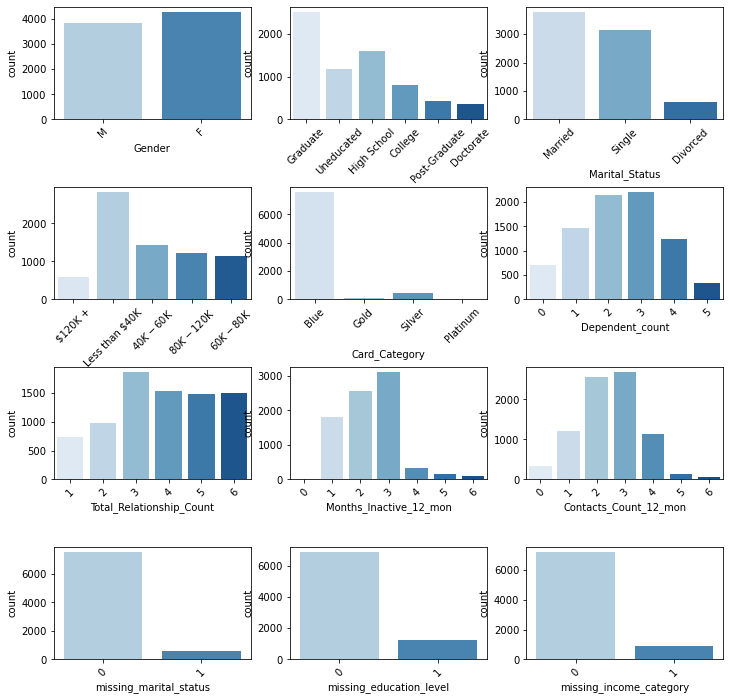

In [45]:
fig, ax = plt.subplots(4,3,figsize=(12,12))
ax = ax.ravel()
count=0
for cat in categorical_columns:
    ar = sns.countplot(x=cat, data=X_train,ax=ax[count], palette='Blues')
    plt.setp(ax[count].get_xticklabels(), rotation=45)
    plt.subplots_adjust(hspace = 0.6)
    count+=1 

### Frequency Count by Attrition

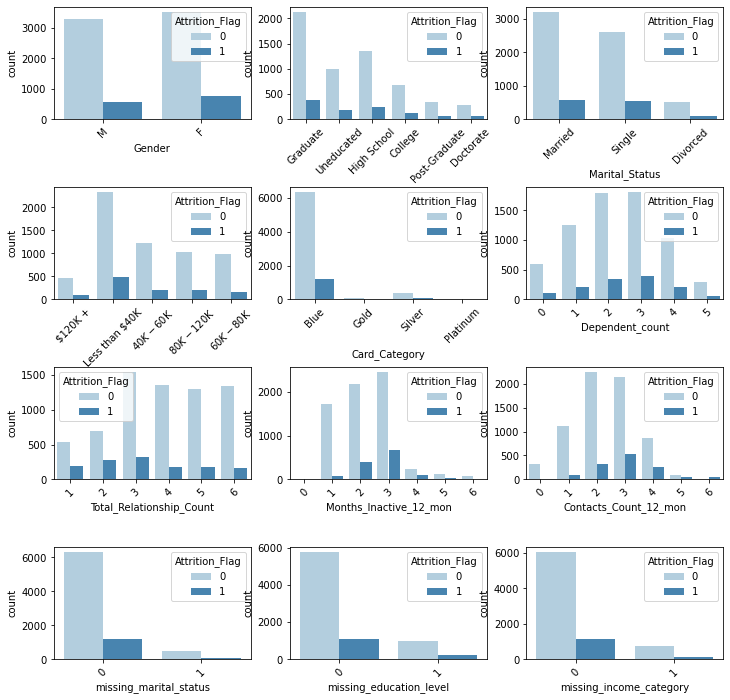

In [46]:
fig, ax = plt.subplots(4,3,figsize=(12,12))
ax = ax.ravel()
count=0
for cat in categorical_columns:
    ar = sns.countplot(x=cat, data=train,ax=ax[count], palette='Blues',hue='Attrition_Flag')
    plt.setp(ax[count].get_xticklabels(), rotation=45)
    plt.subplots_adjust(hspace = 0.6)
    count+=1 

### Frequency Percentage by Attrition

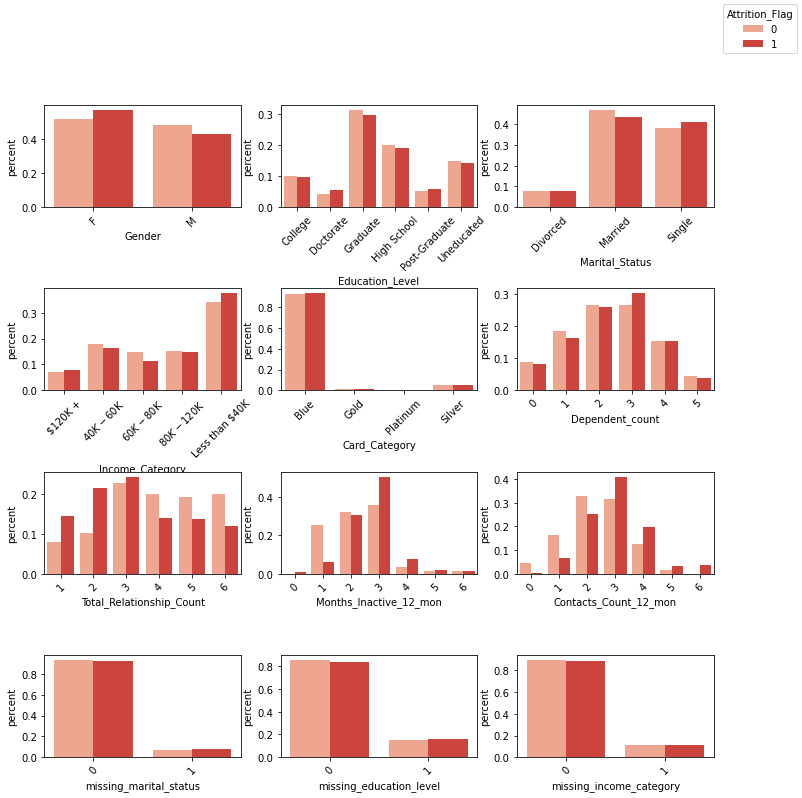

In [36]:
fig, ax = plt.subplots(4,3,figsize=(12,12))
ax = ax.ravel()
count = 0
for cat in categorical_columns:
    category_grouped = (train.groupby(['Attrition_Flag',cat]).size() / train.groupby(['Attrition_Flag']).size()).reset_index().rename({0:'percent'}, axis=1)
    ar = sns.barplot(x=cat, hue='Attrition_Flag', y='percent', data=category_grouped,ax=ax[count], palette='Reds',dodge=True)
    plt.setp(ax[count].get_xticklabels(), rotation=45)
    plt.subplots_adjust(hspace = 0.8)
    ar.legend_.remove()
    count+=1 
handles, labels = ax[count-1].get_legend_handles_labels()
fig.legend(handles, labels,title='Attrition_Flag')

### Categorical Data Observations

** `Gender` : For both genders, the probability of churning is less than the probability of not churning. But it looks like males are less likely to churn than females. This means that gender may be a good predictor of churn.

`Education_Level` : The distribution looks fairly similar for both attrited and non-attrited users. This means that education level may not be a good predictor of churn.

`Marital_Status` : The distribution looks fairly similar for both attrited and non-attrited users. This means that marital status may not be a good predictor of churn.

`Income_Category` : The distribution looks fairly similar for both attrited and non-attrited users. This means that income category may not be a good predictor of churn.

`Card_Category` : The distribution looks fairly similar for both attrited and non-attrited users. This means that card category may not be a good predictor of churn.

`Dependent_Count` : The distribution looks fairly similar for both attrited and non-attrited users. This means that dependent count may not be a good predictor of churn.

** `Total_Relationship_Count` : The percentage of churned people to hold a small number of products is smaller than the percentage of non-churned people to hold a small number of products.

** `Months_Inactive_12_mon` : There is a higher percentage of inactive months for churned people than non-churned people. 

** `Contacts_Count_12_mon` : The average number of contacts seems higher for churned people than non-churned people. 

`Missing_Marital_Status`: The distribution looks fairly similar for both attrited and non-attrited users. This means that missing marital status may not be a good predictor of churn.

`Missing_Education_Level`: The distribution looks fairly similar for both attrited and non-attrited users. This means that missing education level may not be a good predictor of churn.

`Missing_Income_Category`: The distribution looks fairly similar for both attrited and non-attrited users. This means that missing income category may not be a good predictor of churn.
  

** Represents categorical columns that may be a good predictor of churn based off their histograms

In [ ]:
associated_categorical_hist = ['Gender','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon']

## 2.2.2 Numerical Data

In [37]:
numerical_columns

['Customer_Age',
 'Months_on_book',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'missing_marital_status',
 'missing_education_level',
 'missing_income_category']

## Distribution Plots

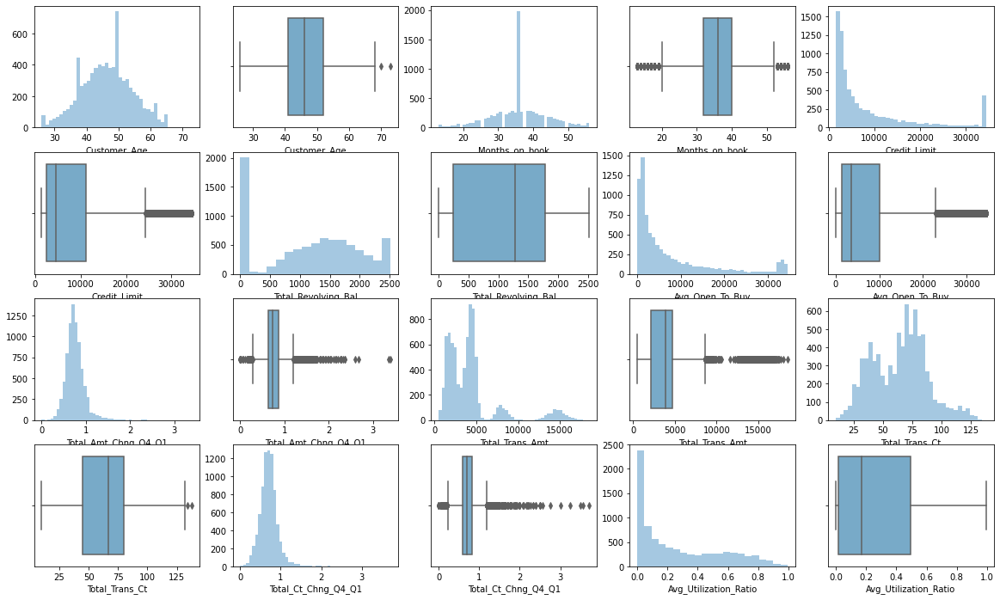

In [47]:
fig, ax = plt.subplots(4,5,figsize=(20,12))
ax = ax.ravel()
count=0
for num in numerical_columns:
    sns.distplot(a=train[num], ax=ax[count],kde=False)
    count+= 1
    sns.boxplot(x=num, data=train, ax=ax[count], palette='Blues')
    count+=1

## Distribution Plots by Attrition

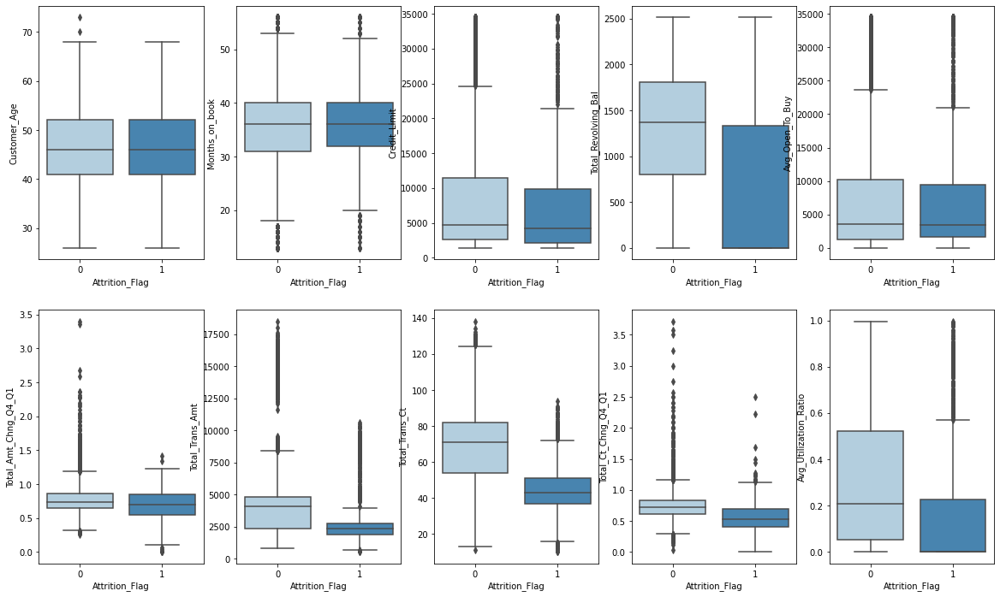

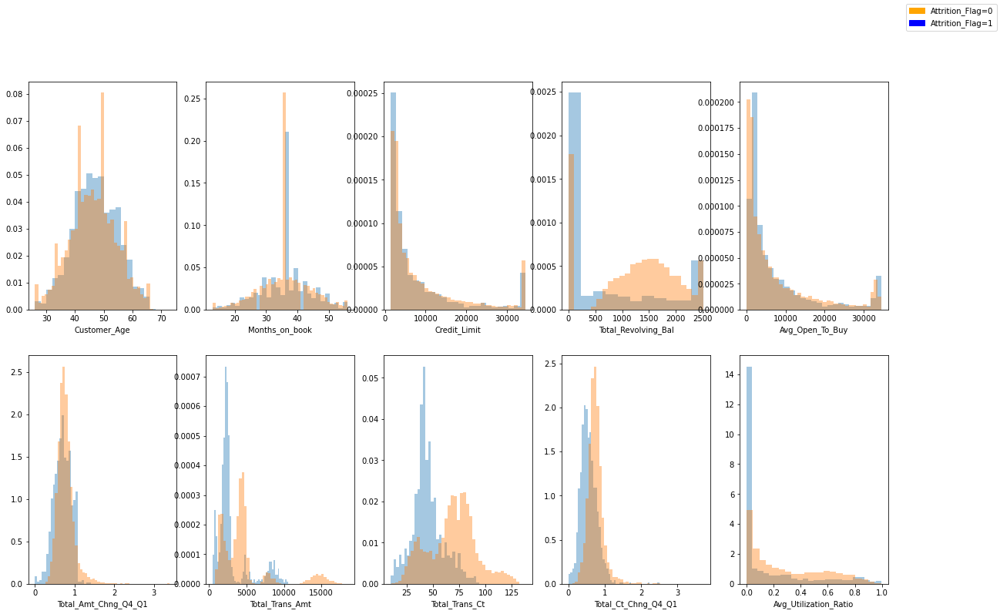

In [51]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count = 0
for n in numerical_columns:
    sns.boxplot(y=n, data=train, ax=ax[count], palette='Blues',x='Attrition_Flag')
    count+=1

    
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0
for num in numerical_columns:
    for a in [churned[num], not_churned[num]]:
        sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)
    count+=1
    
orange_patch = mpatches.Patch(color='orange', label='Attrition_Flag=0')
blue_patch = mpatches.Patch(color='blue', label='Attrition_Flag=1')
fig.legend(handles=[orange_patch,blue_patch])

In [52]:
train[train['Attrition_Flag'] > train['Attrition_Flag'].quantile(.75)]

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,missing_marital_status,missing_education_level,missing_income_category,Attrition_Flag
5,39,F,3,Uneducated,Divorced,NaN,Blue,36,4,3,...,2809.0,0.854,2466,40,0.538,0.000,0,0,1,1
20,31,M,0,Post-Graduate,Married,Less than $40K,Blue,21,1,2,...,3768.0,0.799,6639,71,1.152,0.000,0,0,0,1
23,55,F,1,High School,Married,$40K - $60K,Blue,46,2,4,...,3919.0,0.788,2877,49,0.581,0.153,0,0,0,1
40,47,M,5,High School,Single,$80K - $120K,Blue,37,3,4,...,16283.0,0.482,1575,23,0.211,0.134,0,0,0,1
50,43,M,2,High School,Married,$120K +,Blue,36,6,2,...,33039.0,0.324,1868,40,0.212,0.043,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8078,41,F,3,Graduate,Single,$40K - $60K,Blue,31,4,3,...,4501.0,0.702,2189,51,0.700,0.204,0,0,0,1
8081,37,M,2,NaN,Single,$40K - $60K,Blue,24,6,2,...,10226.0,0.614,2243,44,0.571,0.000,0,1,0,1
8084,45,M,2,Graduate,Married,$60K - $80K,Blue,25,3,5,...,1438.3,0.676,709,27,0.421,0.000,0,0,0,1
8087,42,M,4,Uneducated,Married,$120K +,Blue,34,2,3,...,4727.0,0.567,2682,48,0.231,0.090,0,0,0,1


In [53]:
correlated_numerical_with_attrition

NameError: name 'correlated_numerical_with_attrition' is not defined

In [54]:
associated_numerical_hist = ['Total_Revolving_Bal','Total_Amt_Chng_Q4_Q1','Total_Trans_Amt','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Avg_Utilization_Ratio']

### Numerical Data Observations

`Customer_Age`: The distribution looks fairly similar for both attrited and non-attrited users. This means that education level may not be a good predictor of churn.

`Months_on_book`: The distribution looks fairly similar for both attrited and non-attrited users. This means that Months on book may not be a good predictor of churn. The distribution looks somewhat normal but there is a big spike at around 36 months for both customer types.

`Credit_Limit`: The distribution looks fairly similar for both attrited and non-attrited users. This means that credit limit may not be a good predictor of churn. Both distributions are highly right skewed, and there are some outliers towards the right tail that are prominent for both types of customers. A high percentage of both types also have a credit limit close to 0.

** `Total_Revolving_Bal`: There is a high percentage of customers who have a balance close to 0 which is probably due their credit limit being close to 0. For churned customers, the distribution seems like an inverse gaussian distribution with the majority being at the tails. This may be because they were planning to leave (balance close to 0) or they were just inactive (balance on the right tail). In the non-churned distribution, more customers are clustered around the mean. But, it looks as if there are still many on the left and right tails. Also, almost every user who has a total_revolving_bal less than ~500 and greater than 0 is attrited. This means that total revolving balance may be a good predictor of churn.

`Avg_Open_To_Buy`: The distribution looks fairly similar for both attrited and non-attrited users. This means that average open to buy may not be a good predictor of churn. Both distributions are skewed right meaning that most people have spent an amount close to their credit limit.

** `Total_Amt_Chng_Q4_Q1` : Both distributions are clustered where the vlaue is less than 1 but non-attrited users are somewhat right skewed. Almost everyone who had a value greater than 1 was not attrited meaning those who spent more during the fourth quarter compared to the first quarter did not churn. This means that total amount change may be a good predictor of churn.

** `Total_Trans_Amt` : It seems like there may be more than one mode (polymodal) for both distributions. Everyone who had an amount greater than approximately 11000 was non-attrited as well as those with a value about 3400- approximately 6000. This could indicate that our customers fall into some natural segmentation we can use. This means that total trans amount may be a good predictor of churn.

** `Total_Trans_Ct` : Although it would seem intutive that this count is reflective of the total_trans_amt, the distributions seem to be different. The mean and standard deviation for non-churned customers is higher than churned customers. This makes sense. Everyone who had a count > ~90 was not attrited. This means that total trans count may be a good predictor of churn.

** `Total_Ct_Chng_Q4_Q1` : Both distributions are heavily clustered under value < 1 and look somewhat normal. This means that a majority of customers, churned or not, made the almost the same amount of transactions in quarter 4 compared to quarter 1. This means that total count change may be a good predictor of churn.

** `Avg_Utilization_Ratio` : The majority of churned customers have a ratio of 0 almost everyone who doesn't have that value is an outlier. This means that a majority of users made verys small purchases in regards to their credit limit. Churned customers are more likely to spend close to 0 compared to non-churned customers. This means that average utilization ratio may be a good predictor of churn.

** Represents numerical columns that may be a good predictor of churn based off their histograms

# 2.3 Bivariate Analysis (Correlation)

## 2.3.1 Categorical vs. Categorical Data

### Countplot

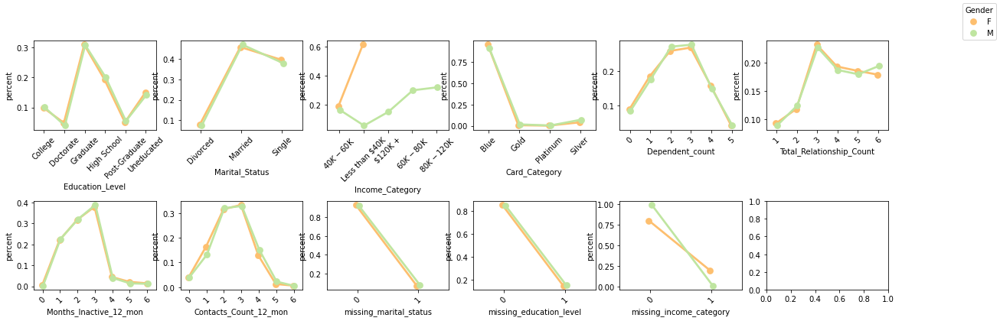

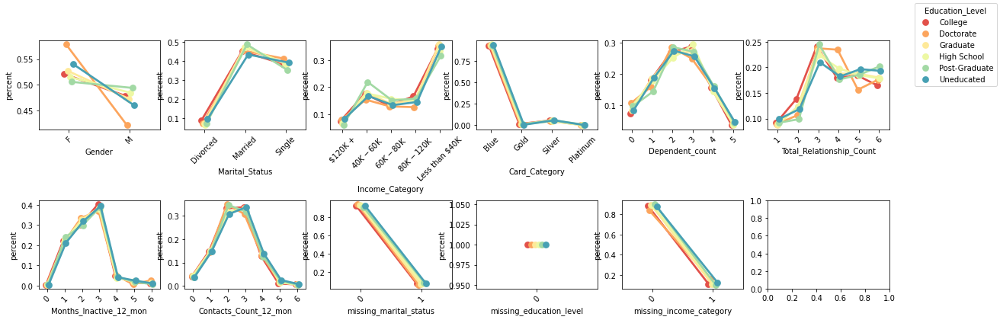

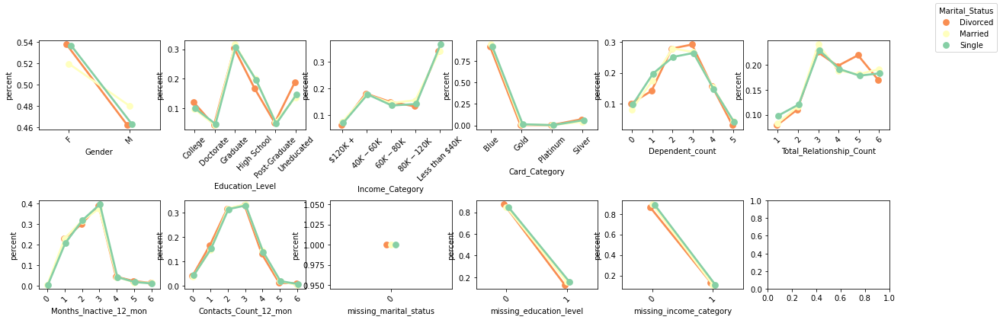

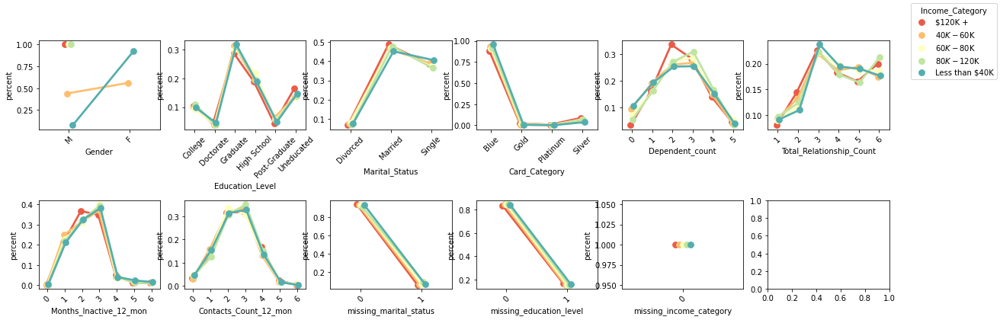

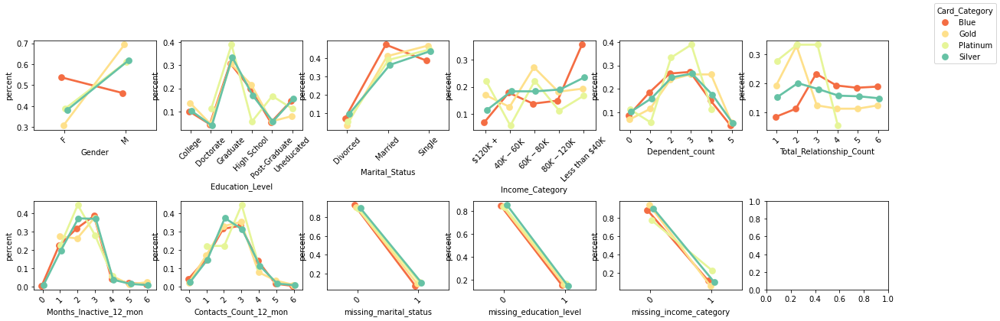

...

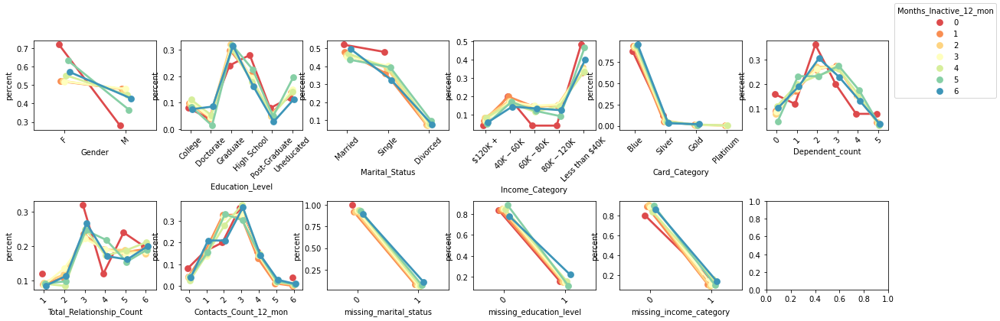

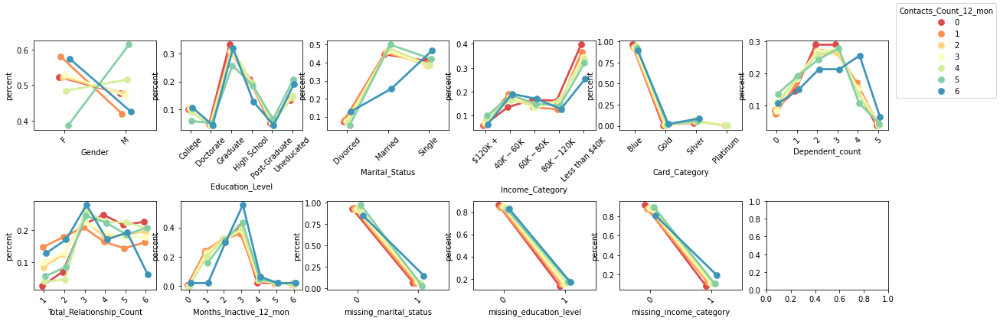

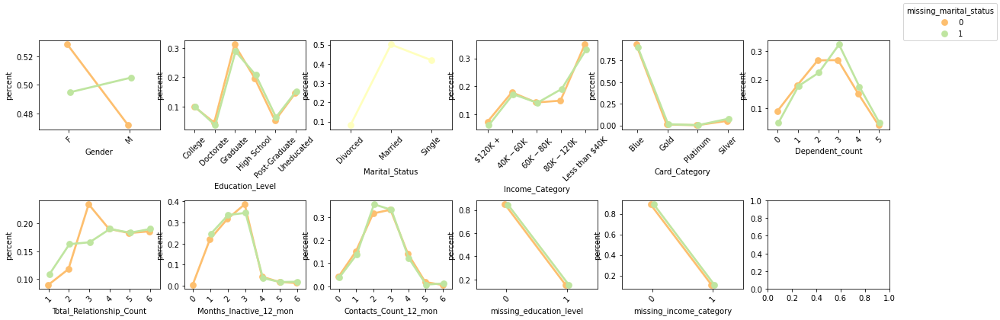

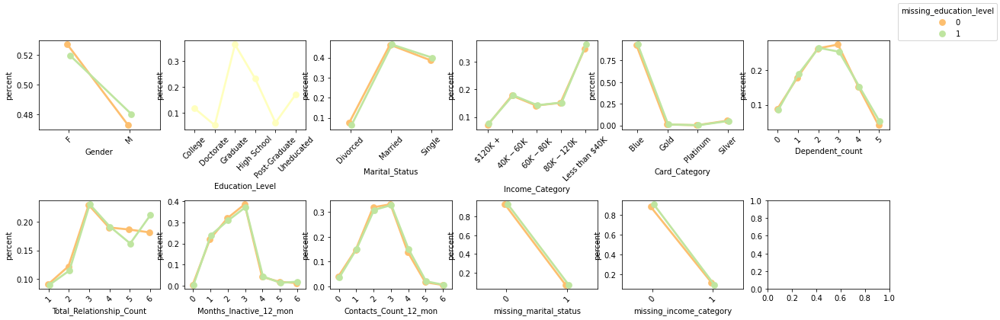

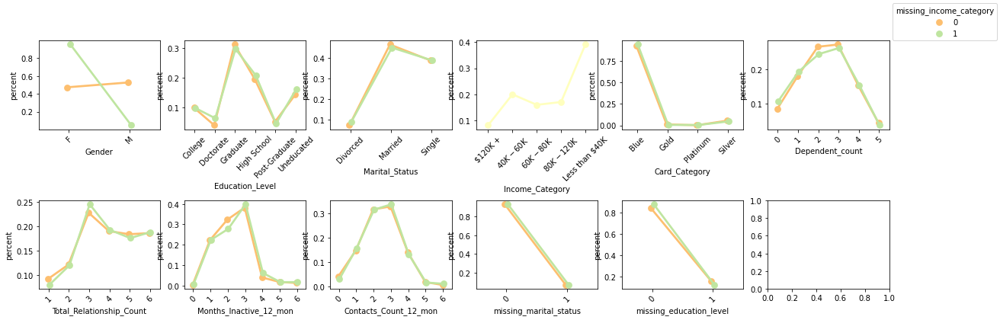

In [55]:
for cat in categorical_columns:
    fig, ax = plt.subplots(2,6,figsize=(20,6))
    ax = ax.ravel()
    count = 0
    for cat1 in categorical_columns:
        if cat1 != cat:
            category_grouped = (X_train.groupby([cat,cat1]).size() / X_train.groupby([cat]).size()).reset_index().rename({0:'percent'}, axis=1)
            ar = sns.pointplot(x=cat1, hue=cat, y='percent', data=category_grouped,ax=ax[count], palette='Spectral',dodge=True)
            plt.setp(ax[count].get_xticklabels(), rotation=45)
            plt.subplots_adjust(hspace = 0.8)
            ar.legend_.remove()
            count+=1 

    handles, labels = ax[count-1].get_legend_handles_labels()
    fig.legend(handles, labels,title=cat)
   


### Chi-Squared Test

We want to see if these observations are statistically significant. We will compute a chi-squared test to see whether there is an association between any pair of categorical variables. 

In [59]:
associated_categorical_variables = []
alpha = .05
enumerated = list(itertools.combinations(categorical_columns, r=2))

for pair in enumerated:
    p_val = stats.chi2_contingency(pd.crosstab(X_train[pair[0]],X_train[pair[1]]))[1]
    if p_val < alpha:
        associated_categorical_variables.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with each other according to Chi-Squared Test: ')
associated_categorical_variables

Categorical Variables associated with each other according to Chi-Squared Test: 


[('Gender', 'Income_Category'),
 ('Gender', 'Card_Category'),
 ('Gender', 'Months_Inactive_12_mon'),
 ('Gender', 'Contacts_Count_12_mon'),
 ('Gender', 'missing_income_category'),
 ('Education_Level', 'missing_income_category'),
 ('Marital_Status', 'Card_Category'),
 ('Marital_Status', 'Dependent_count'),
 ('Income_Category', 'Card_Category'),
 ('Income_Category', 'Dependent_count'),
 ('Card_Category', 'Total_Relationship_Count'),
 ('Card_Category', 'missing_marital_status'),
 ('Dependent_count', 'missing_marital_status'),
 ('Total_Relationship_Count', 'Contacts_Count_12_mon'),
 ('Total_Relationship_Count', 'missing_marital_status'),
 ('Months_Inactive_12_mon', 'missing_income_category'),
 ('Contacts_Count_12_mon', 'missing_marital_status'),
 ('missing_education_level', 'missing_income_category')]

### Chi-Squared Test and Countplot Observations
    
`Income_Category` vs. `Gender` : Every female claim they make less than \\$40K or \\$40K-\\$60K. In contrast, most males claim they make \\$80K-\\$120K, with \\$60K-\\$80K coming in second. Females tend to make less money than males.

`Gender` vs. `Card_Category`: Blue card holders are comprised of more females than male. But, for every other card category the reverse is true.

`Gender` vs. `Contacts_Count_12_mon`: Credit card users who were in contact with 5 people from the credit card company were majority female. Credit card users who were in contact with less than 5 or greater than 5 people from the credit company were majority male.

`Marital_Status` vs. `Card_Category`: People in the blue category are more likely to be married than people in the other categories. People in the blue category are less likely to be single than people in the other categories.

`Marital_Status` vs. `Dependent_count`: People who have dependents are more likely to be married than single. People who have zero dependents are somewhat equally likely to be married or single.

`Card_Category` vs. `Income_Category` : The distribution of incomes for each card category looks vastly different. Blue card holders have more people who make less than \$40K compared to other card categories. People who have more income have a higher card level.

`Income_Category` vs. `Dependent_count`: People who make $120K+ are more likely to have two dependents than any other income level.

`Card_Category` vs. `Total_Relationship_Count` : Platinum members tend to buy only one to three products. The lower the card status, the more spread out the total relationship count distribution is from one to six products. This means there may be a relationship between card category and total relationship count.

`Dependent_count` vs. `Total_Relationship_Count`: People who have less dependents are more likely to purchase more products with the credit card company.

`Dependent_count` vs. `Contacts_Count_12_mon`: People who had more contact with the company are more likely to have more dependents.

`Total_Relationship_Count` vs. `Months_Inactive_12_mon` : The distribution of products owned by a customer is very different for customers who were inactive 0 months out of the last twelve months compared to the rest of customers. People who were active for all months of the past year had a different relationship count pattern than any other type of consumer.

In [60]:
missing_ms = []
alpha = .05
zero = X_train[X_train['missing_marital_status']==0]
one = X_train[X_train['missing_marital_status']==1]

for pair in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train['missing_marital_status'], X_train[pair]))[1]
    if p_val < alpha:
        missing_ms.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with missing_marital_status according to Chi-Squared Test: ', missing_ms)
missing_ic = []
alpha = .05

for pair in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train['missing_income_category'], X_train[pair]))[1]
    if p_val < alpha:
        missing_ic.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with missing_income_category according to Chi-Squared Test: ', missing_ic)

missing_el = []
alpha = .05

for pair in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train['missing_education_level'], X_train[pair]))[1]
    if p_val < alpha:
        missing_el.append(pair)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with missing_education_level according to Chi-Squared Test: ', missing_el)

Categorical Variables associated with missing_marital_status according to Chi-Squared Test:  ['Card_Category', 'Dependent_count', 'Total_Relationship_Count', 'Contacts_Count_12_mon', 'missing_marital_status']
Categorical Variables associated with missing_income_category according to Chi-Squared Test:  ['Gender', 'Education_Level', 'Months_Inactive_12_mon', 'missing_education_level', 'missing_income_category']
Categorical Variables associated with missing_education_level according to Chi-Squared Test:  ['missing_education_level', 'missing_income_category']


## 2.3.1 Target vs. Categorical Data

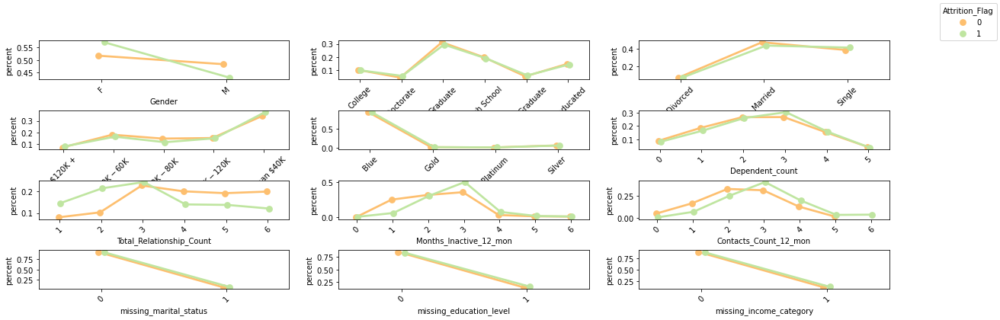

In [62]:
count=0
fig, ax = plt.subplots(4,3,figsize=(20,6))
ax = ax.ravel()
for cat1 in categorical_columns:
    category_grouped = (train.groupby(['Attrition_Flag',cat1]).size() / train.groupby(['Attrition_Flag']).size()).reset_index().rename({0:'percent'}, axis=1)
    ar = sns.pointplot(x=cat1, hue='Attrition_Flag', y='percent', data=category_grouped,ax=ax[count], palette='Spectral',dodge=True)
    plt.setp(ax[count].get_xticklabels(), rotation=45)
    plt.subplots_adjust(hspace = 0.8)
    ar.legend_.remove()
    count+=1 
handles, labels = ax[count-1].get_legend_handles_labels()
fig.legend(handles, labels,title='Attrition_Flag')


In [64]:
associated_categorical_variables_with_target = []
alpha = .05

for cat in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(train[cat],train['Attrition_Flag']))[1]
    if p_val < alpha:
        associated_categorical_variables_with_target.append(cat)
        #print('We REJECT the null hypothesis. There IS an association between', pair, 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with Attrition_Flag: ')
associated_categorical_variables_with_target

Categorical Variables associated with Attrition_Flag: 


['Gender',
 'Income_Category',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon']

### Chi-Squared Test and Countplot Results

`Gender`: People who attrite are more likely to be female than male.

`Income_Category`: People who earn certain incomes are more likely to attrite than others.

`Total_Relationship_Count`: People who bought more products are less likely to attrite.

`Months_Inactive_12_mon`: As months inactive increases, so does the probability of attriting.

`Contacts_Count_12_mon`: Consumers who were in contact with more people in the credit card company are more likely to attrite.

## 2.3.2 Numerical vs. Numerical

### Scatterplots

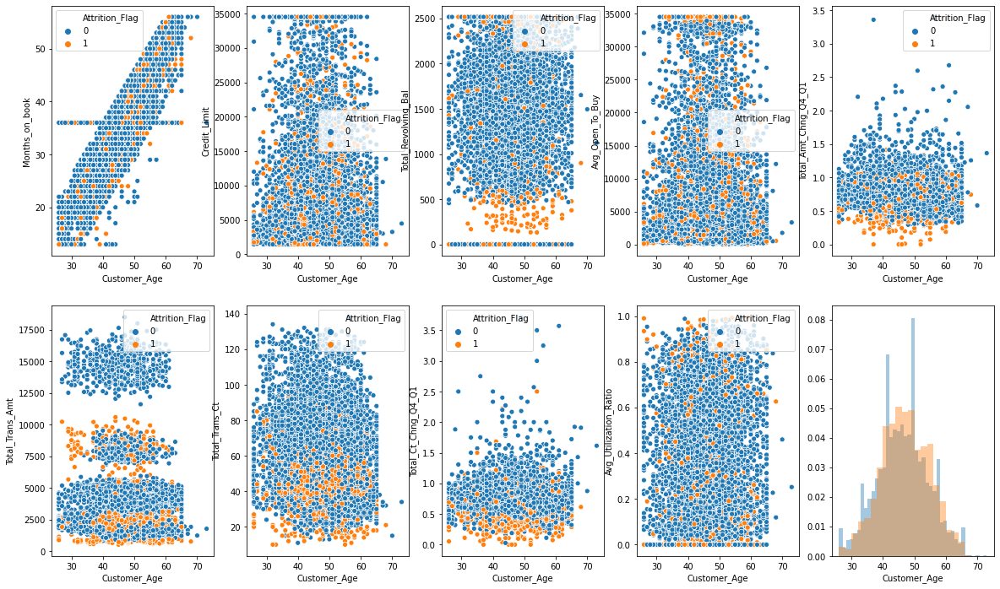

In [66]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Customer_Age'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [not_churned[col], churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Customer_Age` Insights

`Months_on_book` : There seems to be a linear postive relationship between customer_age and months_on_book.

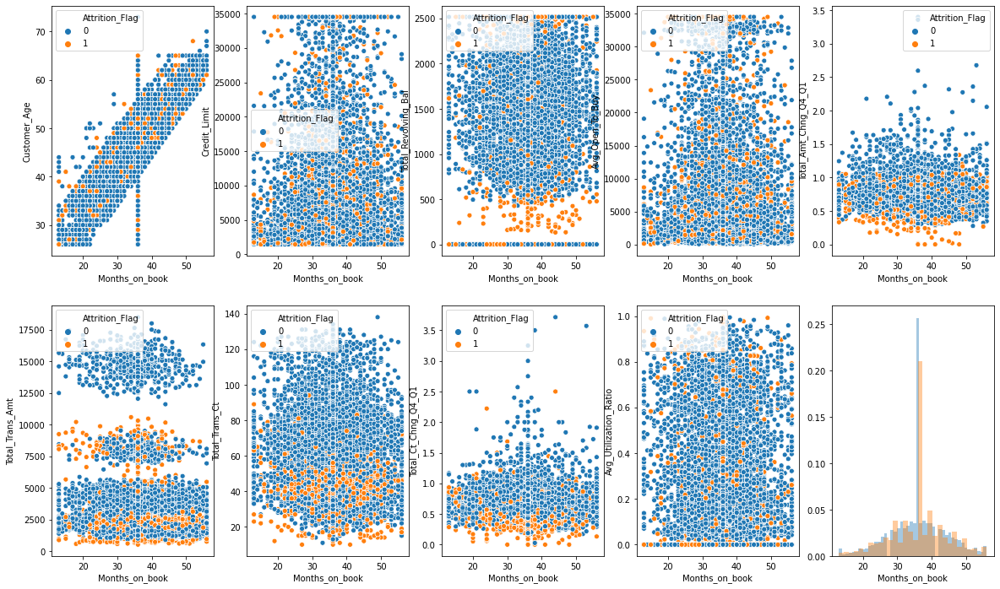

In [67]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Months_on_book'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [not_churned[col], churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Months_on_book` Observations

`Customer_Age` : There seems to be a linear postive relationship between customer_age and months_on_book.

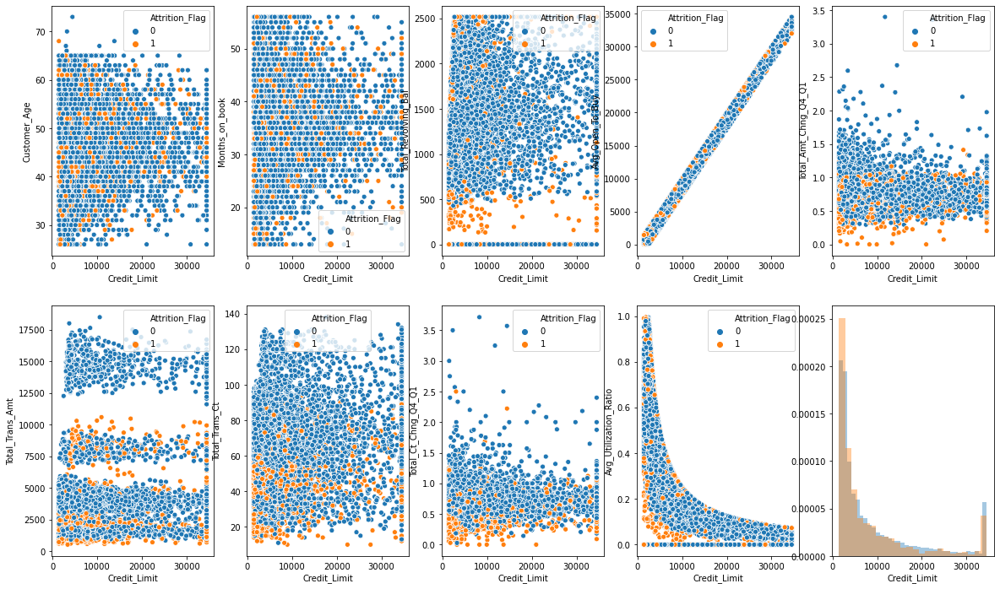

In [69]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Credit_Limit'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [not_churned[col], churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Credit_Limit` Observations

`Avg_Open_To_Buy` : There is a positive linear relationship between the two variables with correlation close to 1. The higher the credit limit, the more money left to spend.

`Avg_Utilization_Ratio` : There is a negative relationship between the two variables. The more credit someone has, the less of it they spend.

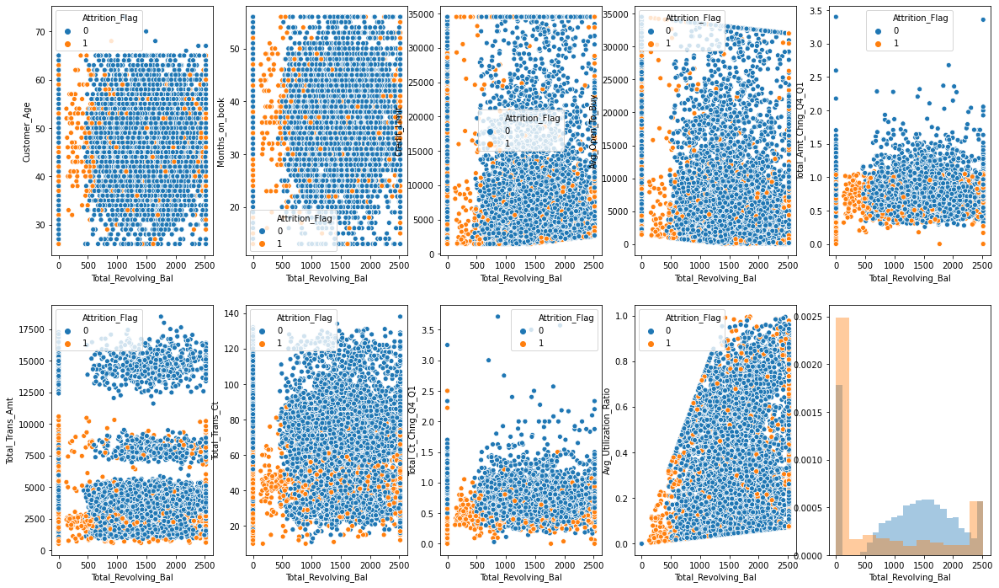

In [70]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Total_Revolving_Bal'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [not_churned[col], churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Total_Revolving_Bal` Observations

`Avg_Utilization_Ratio` : People who have a higher total revolving balance spend more of their credit.

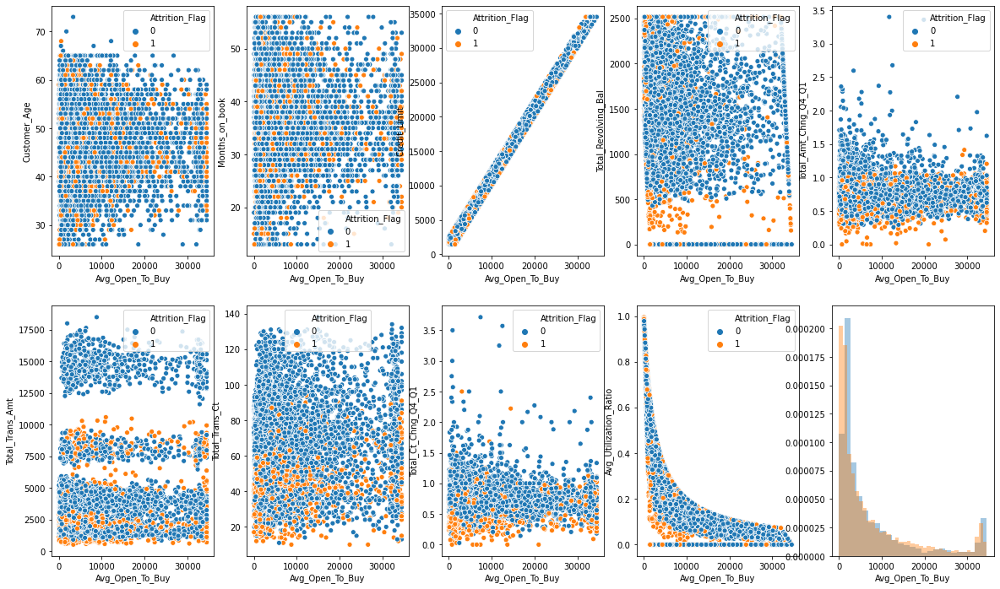

In [71]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Avg_Open_To_Buy'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [churned[col], not_churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Avg_Open_To_Buy` Observations

`Credit_Limit` : People with a higher credit limit spend more of it.
    
`Avg_Utilization_Ratio` : People who have more credit left spend less of their credit.

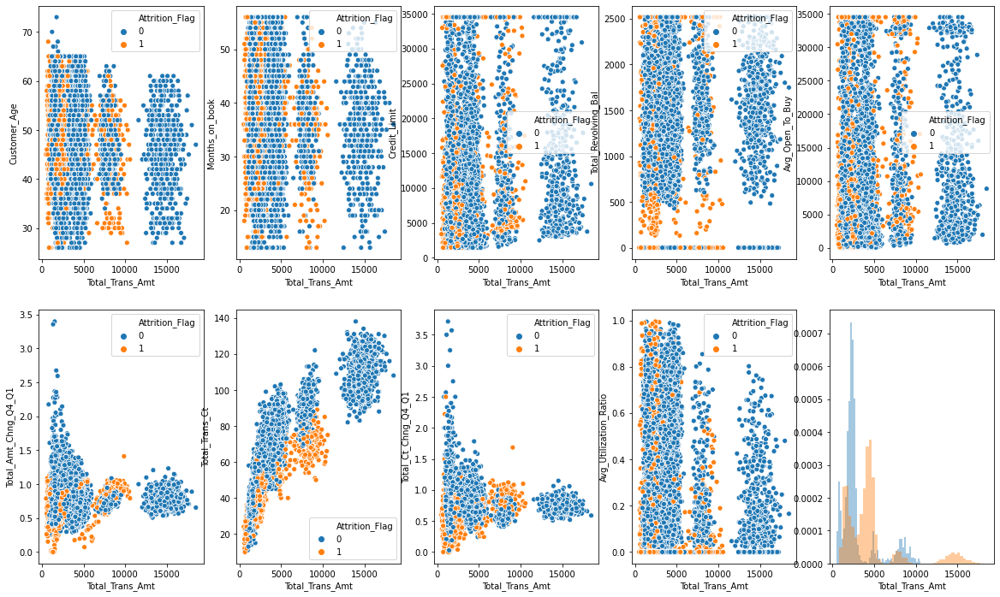

In [72]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Total_Trans_Amt'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [churned[col], not_churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Total_Trans_Amt` Observations

`Total_Trans_Ct` : The more transactions people make, the more credit they spend.

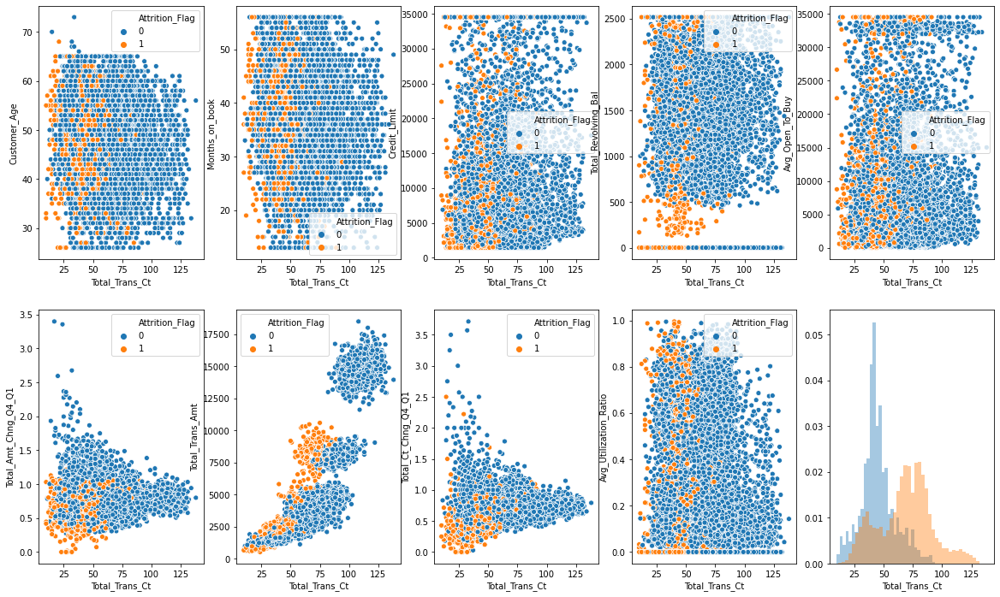

In [73]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Total_Trans_Ct'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [churned[col], not_churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Total_Trans_Ct` Observations

`Total_Trans_Amt` : The more transactions people make, the more credit they spend.

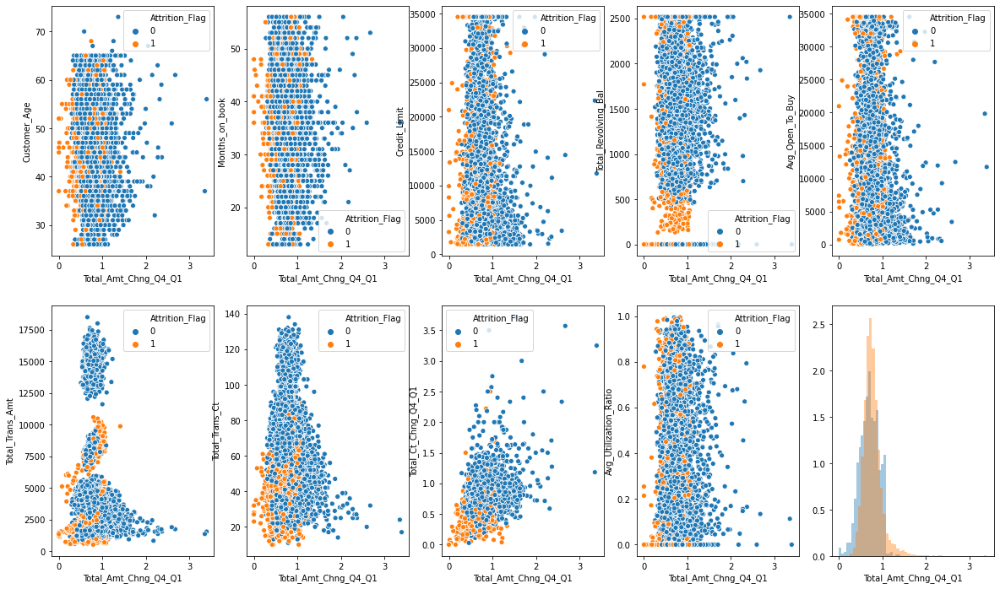

In [74]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Total_Amt_Chng_Q4_Q1'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [churned[col], not_churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Total_Amt_Chng_Q4_Q1` Observations

`Total_Ct_Chng_Q4_Q1` : People who make more transactions in their last quarter of the past year than the first quarter spend more in the last quarter than the first quarter.

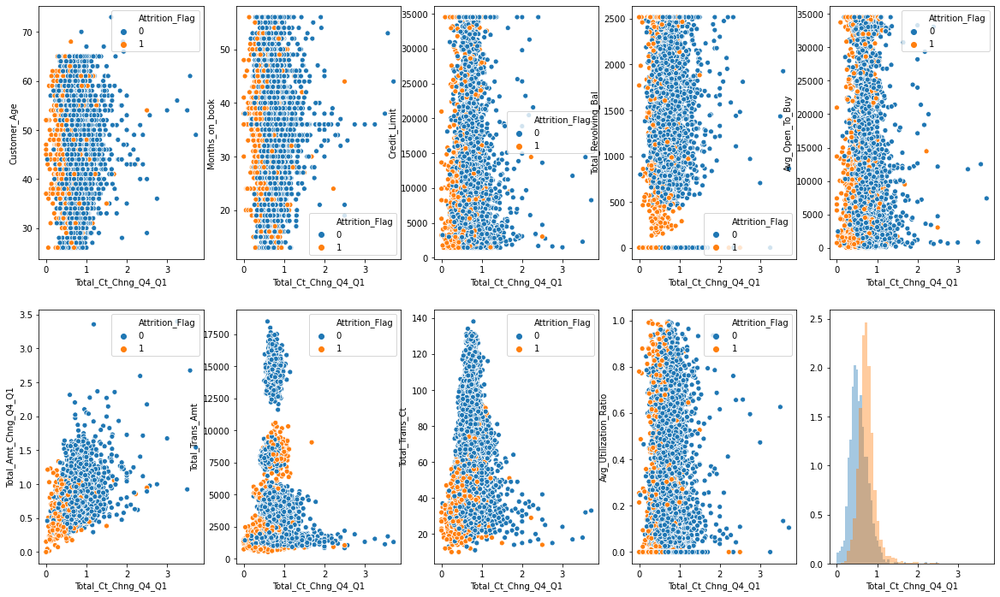

In [76]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Total_Ct_Chng_Q4_Q1'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [churned[col], not_churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Total_Ct_Chng_Q4_Q1` Observations

`Total_Amt_Chng_Q4_Q1` : People who make more transactions in their last quarter of the past year than the first quarter spend more in the last quarter than the first quarter.

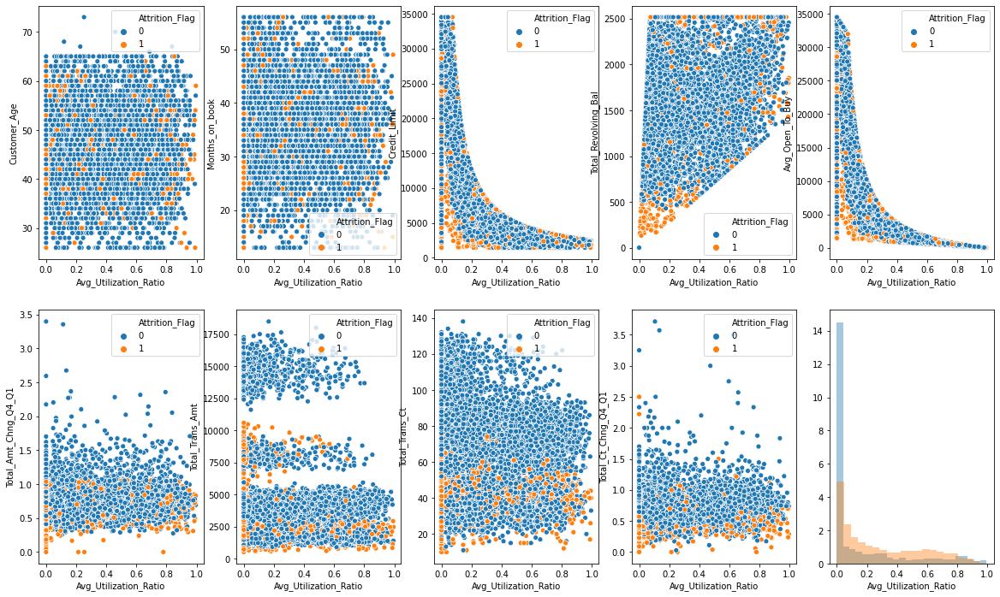

In [77]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0

col = 'Avg_Utilization_Ratio'

for num in numerical_columns:
    if num != col:
        sns.scatterplot(y=num,x=col,ax=ax[count],data=train,hue='Attrition_Flag')
        count+=1
    
for a in [churned[col], not_churned[col]]:
    sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)

### `Avg_Utilization_Ratio` Observations

`Credit_Limit` : There is a negative relationship.
    
`Total_Revolving_Bal` : There is a positive relationship.

### Correlation Heatmaps

We will be assessing Spearman correlation to account for non-linear relationships.

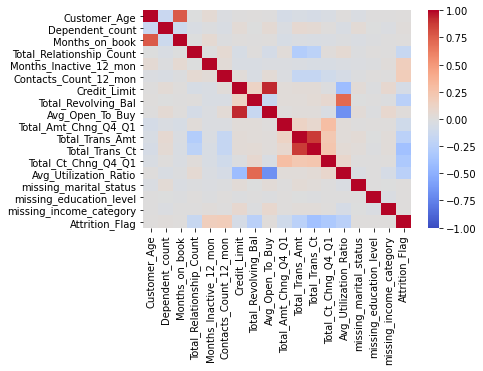

In [80]:
sns.heatmap(train.corr(method='spearman'), vmin = -1, vmax = 1, center = 0, cmap = 'coolwarm')
plt.show()

In [82]:
s = train.corr('spearman').unstack()

s_sorted = s.sort_values(kind="quicksort",ascending=False)

associated_numerical_positive = s_sorted[(s_sorted.values < 1) & (s_sorted.values >.50) & (s_sorted.index.get_level_values(0) !='Attrition_Flag') & (s_sorted.index.get_level_values(1) !='Attrition_Flag')]
print(associated_numerical_positive)

associated_numerical_negative = s_sorted[(s_sorted.values < 0) & (s_sorted.values <-.5) & (s_sorted.index.get_level_values(0) !='Attrition_Flag') & (s_sorted.index.get_level_values(1) !='Attrition_Flag')]
print(associated_numerical_negative)

Avg_Open_To_Buy        Credit_Limit             0.934062
Credit_Limit           Avg_Open_To_Buy          0.934062
Total_Trans_Amt        Total_Trans_Ct           0.878350
Total_Trans_Ct         Total_Trans_Amt          0.878350
Customer_Age           Months_on_book           0.769199
Months_on_book         Customer_Age             0.769199
Total_Revolving_Bal    Avg_Utilization_Ratio    0.712238
Avg_Utilization_Ratio  Total_Revolving_Bal      0.712238
dtype: float64
Avg_Open_To_Buy        Avg_Utilization_Ratio   -0.677721
Avg_Utilization_Ratio  Avg_Open_To_Buy         -0.677721
dtype: float64


### Numerical vs. Numerical Correlated Features:

`Credit_Limit` vs. `Avg_Open_To_Buy`: 0.934062 There is a positive linear relationship between the two variables with correlation close to 1. This indicates that people who have a higher credit limit have more unspent credit.

`Total_Trans_Ct` vs. `Total_Trans_Amt`: 0.878350 There is a positive relationship between the two variables. Those who spend a large amount of credit make more transactions.

`Customer_Age` vs. `Months_on_book`: 0.769199 There is a linear postive relationship between customer_age and months_on_book.Older customers have a longer relationship with the company.

`Total_Revolving_Bal` vs. `Avg_Utilization_Ratio`: 0.712238 Total_Revolving Balance is used in the equation for Avg_Utilization. People who spend more credit have a higher average utilization ratio.

`Avg_Utilization_Ratio` vs`Avg_Open_To_Buy`: -0.677721 People who spend less of their credit limit have more credit left to spend.


### Less Correlated Features:

`Avg_Utilization_Ratio` vs`Credit_Limit` -0.416959: People who spend less of their credit have more credit.

`Total_Relationship_Count` vs`Total_Trans_Amt` -0.279113: People who have a longer relationship with the bank spend less credit.

`Total_Relationship_Count` vs`Total_Trans_Ct` -0.226808: People who have a longer relationship with the bank make less transactions.

`Total_Trans_Ct` vs`Contacts_Count_12_mon` -0.168413: People who make more transactions were inactive for less months compared to those who made less transactions.

`Contacts_Count_12_mon` vs`Total_Trans_Amt` -0.167372: People who spend more credit had less contact with the bank.

`Avg_Open_To_Buy` vs`Total_Revolving_Bal` -0.154165: People who spend more of their credit have less credit to spend.

`Total_Ct_Chng_Q4_Q1` vs. `Total_Amt_Chng_Q4_Q1`: 0.301981 People who spend more in the fourth quarter compared to the first make more transactions in the fourth quarter than the first.

`Total_Trans_Ct` vs. `Total_Ct_Chng_Q4_Q1`: 0.233448: People who make more transactions in general spend their money more in the fourth quarter compared to the first. People who make less transactions do not increase the number of transactions made in the fourth quarter compared to the first.

`Total_Ct_Chng_Q4_Q1` vs. `Total_Trans_Amt`: 0.222688: People who make more transactions in the fourth quarter compared to the first spend more credit in general.

In [ ]:
correlated_numerical_with_attrition = X.corr('spearman')['Attrition_Flag']
correlated_numerical_with_attrition = correlated_numerical_with_attrition[(correlated_numerical_with_attrition.values < 1) & (abs(correlated_numerical_with_attrition.values) >.20)]#.sort_values(ascending=False)
correlated_numerical_with_attrition

In [ ]:
X.corr('spearman')['Attrition_Flag'].sort_values()**2

### Numerical vs. Target Correlation Observations:

`Total_Trans_Ct` -0.376115: People who make less transactions are more likely to attrite.

`Total_Ct_Chng_Q4_Q1` -0.312059: People who make more transactions in the fourth quarter compared to the first quarter are less likely to attrite.

`Total_Revolving_Bal` -0.240551: People who spend more credit are less likely to attrite.

`Avg_Utilization_Ratio` -0.240385: People who spend a larger proportion of their credit limit are less likely to attrite.

`Total_Trans_Amt` -0.223782: People who spend more credit are less likely to attrite.

`Contacts_Count_12_mon` 0.189038: People who have more contact with the bank in the last twelve months are more likely to attrite.

`Months_Inactive_12_mon` 0.171839: People who were inactive for more months of the last year are more likely to attrite.

###  Wilcoxon Rank-Sum Test

Since none of the distributions are normal, we will compute wilcoxon rank-sum test to see if medians are same for attrited variables.

In [ ]:
related_columns = []
for col_name in numerical_columns:
    pval = stats.ranksums(churned[col_name], not_churned[col_name]).pvalue
    if pval < alpha:
        related_columns.append(col_name)
print('Numerical Features with different medians for churned and non-churned customers: ')
related_columns

In [ ]:
correlated_numerical_with_attrition

### Comparing Correlation Results with Wilcoxon Rank-Sum Results

Not Surprising Results:

`Avg_Utilization_Ratio`,`Total_Amt_Chng_Q4_Q1`, `Total_Ct_Chng_Q4_Q1`,`Total_Trans_Ct`, `Total_Trans_Amt` and `Total_Revolving_Bal`: These attributes were important in both statistics for determining attrition. People who increasingly spend more of their credit limit within the last year are less likely to attrite.

`Credit_Limit`: The difference in median values for churned and non-churned customers for this attribute was statitically significant, but did not have a strong correlation with attrition rate. 

In [ ]:
associated_categorical_and_numerical_variables = []

for cat in missing_columns:
    for num in numerical_columns:
        zero = X_train[X_train[cat] == 0]
        one = X_train[X_train[cat] == 1]
        pval = stats.kruskal(zero[num].values,one[num].values).pvalue
        if pval < alpha:
            #print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
            associated_categorical_and_numerical_variables.append((cat,num,1))

cat = 'Gender'
for num in numerical_columns:
    female = X_train[X_train[cat] == 'F']
    male = X_train[X_train[cat] == 'M']
    pval = stats.kruskal(female[num].values,male[num].values).pvalue
    if pval < alpha:
       # print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
        associated_categorical_and_numerical_variables.append((cat,num,1))
   
three_categories = ['Marital_Status']
for cat in three_categories:
    cats = X_train[cat].value_counts().index
    for num in numerical_columns:
        cat1 = X_train[X_train[cat] == cats[0]][num].values
        cat2 = X_train[X_train[cat] == cats[1]][num].values
        cat3 = X_train[X_train[cat] == cats[2]][num].values
        pval = stats.kruskal(cat1,cat2,cat3).pvalue
        if pval < alpha:
            #print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
            associated_categorical_and_numerical_variables.append((cat,num,1))
        
        
four_categories = ['Card_Category']
for cat in four_categories:
    cats = X_train[cat].value_counts().index
    for num in numerical_columns:
        cat1 = X_train[X_train[cat] == cats[0]][num].values
        cat2 = X_train[X_train[cat] == cats[1]][num].values
        cat3 = X_train[X_train[cat] == cats[2]][num].values
        cat4 = X_train[X_train[cat] == cats[3]][num].values
        pval = stats.kruskal(cat1,cat2,cat3,cat4).pvalue
        if pval < alpha:
            #print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
            associated_categorical_and_numerical_variables.append((cat,num,1))
            
five_categories = ['Income_Category']
for cat in five_categories:
    cats = X_train[cat].value_counts().index
    for num in numerical_columns:
        cat1 = X_train[X_train[cat] == cats[0]][num].values
        cat2 = X_train[X_train[cat] == cats[1]][num].values
        cat3 = X_train[X_train[cat] == cats[2]][num].values
        cat4 = X_train[X_train[cat] == cats[3]][num].values
        pval = stats.kruskal(cat1,cat2,cat3,cat4).pvalue
        if pval < alpha:
            #print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
            associated_categorical_and_numerical_variables.append((cat,num,1))
            
six_categories = ['Dependent_count','Total_Relationship_Count','Education_Level']

for cat in six_categories:
    cats = X_train[cat].value_counts().index
    for num in numerical_columns:
        cat1 = X_train[X_train[cat] == cats[0]][num].values
        cat2 = X_train[X_train[cat] == cats[1]][num].values
        cat3 = X_train[X_train[cat] == cats[2]][num].values
        cat4 = X_train[X_train[cat] == cats[3]][num].values
        cat5 = X_train[X_train[cat] == cats[4]][num].values
        cat6 = X_train[X_train[cat] == cats[5]][num].values
        pval = stats.kruskal(cat1,cat2,cat3,cat4,cat5,cat6).pvalue
        if pval < alpha:
            #print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
            associated_categorical_and_numerical_variables.append((cat,num,1))    
            
seven_categories = ['Months_Inactive_12_mon','Contacts_Count_12_mon' ]

for cat in seven_categories:
    cats = X_train[cat].value_counts().index
    for num in numerical_columns:
        cat1 = X_train[X_train[cat] == cats[0]][num].values
        cat2 = X_train[X_train[cat] == cats[1]][num].values
        cat3 = X_train[X_train[cat] == cats[2]][num].values
        cat4 = X_train[X_train[cat] == cats[3]][num].values
        cat5 = X_train[X_train[cat] == cats[4]][num].values
        cat6 = X_train[X_train[cat] == cats[5]][num].values
        cat7 = X_train[X_train[cat] == cats[6]][num].values
        pval = stats.kruskal(cat1,cat2,cat3,cat4,cat5,cat6,cat7).pvalue
        if pval < alpha:
            #print('There is a relationship between categorical variable', cat, 'and numerical variable', num)
            associated_categorical_and_numerical_variables.append((cat,num,1)) 

associated_categorical_and_numerical_variables

In [ ]:
import collections
val_1=collections.Counter([x for (x,y,z) in associated_categorical_and_numerical_variables])
val_2=collections.Counter([y for (x,y,z) in associated_categorical_and_numerical_variables])
print('Number of Categorical: ',len(categorical_columns))
print('Number of Numerical:', len(numerical_columns))
display(val_1)
display(val_2)

The higher the number, the more features it is correlated with.

In [ ]:
len(associated_categorical_and_numerical_variables)

In [ ]:
df_num_cat = pd.DataFrame(associated_categorical_and_numerical_variables, columns =['Categorical', 'Numerical', 'Relationship']) 
pivot_num_cat = df_num_cat.pivot('Categorical', 'Numerical','Relationship') 

sns.heatmap(pivot_num_cat)

In [ ]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count = 0
for num in numerical_columns:
        sns.boxenplot(x=num, data=X_train, ax=ax[count], palette='Blues',y='Education_Level')
        plt.setp(ax[count].get_xticklabels(), rotation=45)
        plt.subplots_adjust(hspace = 0.8)
        if count !=0:
            plt.axis("off")
        count+=1

Observations:

Education_Level: There are not numerical variables that are associated with education_level meaning education_level doesn't play a significant role in determiging churned and non-churned customers. This is surprising.

In [ ]:

fig, ax = plt.subplots(5,3,figsize=(20,12))
ax = ax.ravel()
count = 0
for cat,num,one in associated_categorical_and_numerical_variables[:15]:
        sns.violinplot(y=num, data=X_train, ax=ax[count], palette='Blues',x=cat)
        plt.setp(ax[count].get_xticklabels(), rotation=45)
        plt.subplots_adjust(hspace = 0.8)
        count+=1

`Gender` and `Credit_Limit` : Females generally have lower credit limit than males. 

`Gender` and `Avg_Open_To_Buy` : Although males and females tend to spend the same amount of credit, females have less credit left because of their lower credit limit.

`Gender` and `Total_Trans_Amt` and `Total_Trans_Ct`: Females generally spend a little bit more and make more transactions than males.

`Gender` and `Avg_Utilization_Ratio` : Males have a lower utilization ratio because they spend slightly less credit than females but also have a much higher credit limit.

In [ ]:
fig, ax = plt.subplots(5,3,figsize=(20,12))
ax = ax.ravel()
count = 0
for cat,num,one in associated_categorical_and_numerical_variables[15:30]:
        sns.violinplot(y=num, data=X_train, ax=ax[count], palette='Blues',x=cat)
        plt.setp(ax[count].get_xticklabels(), rotation=45)
        plt.subplots_adjust(hspace = 0.8)
        count+=1

`Card_Category` vs. `Credit_Limit` : Those who are in the Blue category have a much lower credit_limit than those in Gold, Silver, and Platinum with Platinum having the highest median.

`Card_Category` vs. `Avg_Utilization_Ratio` : Those in the blue category are more likely spend an amount closer to their credit limit than other card categories, but keep in mind their credit limits are much lower than other card categories. There is still a substantial population of blue card holders who don't use their credit cards.

`Customer_Age` vs. `Income_Category`: Those who make 120K+ tend to be older.

`Months_on_book` vs. `Income_Category`: The spike at 36 months is prevalant for all people of different income.

`Credit_Limit` vs. `Income_Category`: People who make 80K and more tend to have a higher credit limit than those who make less.

`Avg_Open_To_Buy` vs. `Income_Category`: People who make 80K and more tend have more credit not spent than those who make less.

`Avg_Utilization_Ratio` vs. `Income_Category`: People who make 60K or more tend to have a utilization_ratio closer to 0, meaning they don't spend close to their credit limit.

`Avg_Utilization_Ratio` vs. `Income_Category`: Adults who are very young or very old have less dependents than people who are middle aged.

In [ ]:
fig, ax = plt.subplots(5,3,figsize=(20,12))
ax = ax.ravel()
count = 0
for cat,num,one in associated_categorical_and_numerical_variables[30:45]:
        sns.violinplot(y=num, data=X_train, ax=ax[count], palette='Blues',x=cat)
        plt.setp(ax[count].get_xticklabels(), rotation=45)
        plt.subplots_adjust(hspace = 0.8)
        count+=1

`Months_on_book` vs `Dependent_count` : People who have less dependents tend to be older.

`Total_Relationship_Amt` vs. `Total_Trans_Amt`: People who bought less products from the credit card company tend to spend more.

`Total_Relationship_Ct` vs. `Total_Trans_Amt`: People who bought less products from the credit card company tend to have more transactions.

`Months_Inactive_12_mon` vs. `Customer_Age`: Older people tend to be more active.

In [ ]:
fig, ax = plt.subplots(5,3,figsize=(20,12))
ax = ax.ravel()
count = 0
for cat,num,one in associated_categorical_and_numerical_variables[45:]:
        sns.violinplot(y=num, data=X_train, ax=ax[count], palette='Blues',x=cat)
        plt.setp(ax[count].get_xticklabels(), rotation=45)
        plt.subplots_adjust(hspace = 0.8)
        count+=1

In [ ]:
`Months_on_book` vs. `Months_Inactive_12_mon`: People who were inactive for less months tend to have a longer relationship with the credit card company and did not have a spike at 36 months. But, those who were inactive for a longer time tend to not have as large of a spike at 36 months either.

`Months_Inactive_12_mon`: We can group people into inactive statuses of 0 months, 1-3 months, and 4-6 months. Credit_Limit, Total_Reovlving_Bal, Total_Trans_Amt, Total_Trans_Ct, and Avg-Utilization_Ratio.

`Avg_Utilization_Ratio` vs. `Contacts_Count_12_mon`: Customers who spoke to more contacts have a lower median Avg-Utilization_ratio compared to those who spoke to less contacts, meaning they spent a bigger portion of their credit limit.

In [ ]:
### Why are there so many people who have a `Months_on_book` value of 36?

In [ ]:
months_36 = X[X['Months_on_book'] == 36]
months_not_36 = X[X['Months_on_book'] != 36]
display(months_36.describe())
display(months_not_36.describe())

In [ ]:
X['is_36'] = np.where(X['Months_on_book'] == 36, 1,0)

# can't use no

In [ ]:
associated_categorical_variables_with_month = []
alpha = .05

for cat in categorical_columns:
    p_val = stats.chi2_contingency(pd.crosstab(X_train[cat],X_train['is_36']))[1]
    if p_val < alpha:
        associated_categorical_variables_with_month.append(cat)
        #print('We REJECT the null hypothesis. There IS an association between', 'with p-value of ',p_val)
    #else:
       # print('We ACCEPT the null hypothesis. There IS NOT an association between', pair, 'with p-value of ',p_val)
print('Categorical Variables associated with Months_on_book = 36: ')
associated_categorical_variables_with_month

In [ ]:
fig, ax = plt.subplots(2,2,figsize=(20,12))
ax = ax.ravel()
count=0

for cat1 in associated_categorical_variables_with_month:
    category_grouped = (X_train.groupby(['is_36',cat1]).size() / X_train.groupby(['is_36']).size()).reset_index().rename({0:'percent'}, axis=1)
    ar = sns.pointplot(x=cat1, hue='is_36', y='percent', data=category_grouped,ax=ax[count], palette='Spectral',dodge=True)
    plt.setp(ax[count].get_xticklabels(), rotation=45)
    count+=1 
 
fig, ax = plt.subplots(2,2,figsize=(20,12))
ax = ax.ravel()
count=0
for cat1 in associated_categorical_variables_with_month:
    category_grouped = (X_train.groupby(['is_36',cat1]).size() / X_train.groupby([cat1]).size()).reset_index().rename({0:'percent'}, axis=1)
    ar = sns.pointplot(x='is_36', hue=cat1, y='percent', data=category_grouped,ax=ax[count], palette='Spectral',dodge=True)
    plt.setp(ax[count].get_xticklabels(), rotation=45)
    count+=1 

In [ ]:
### Observations

`Gender`: The gender distribution is more evenly distributed when months-on-book is not equal to 36; in contrast the gender distribution is more skewed towards females when months-on-book equals 36.

`Income_Category`: As income increases, the likelihood of having a months-on-book value = 36 decreases.

`Dependent_count`: People who have more dependents are more likely to have a months-on-book value of 36.

`Months_Inactive_12_mon`: The more inactive a person is, the more likely they have a months-on-book value of 36.

In [ ]:
fig, ax = plt.subplots(2,5,figsize=(20,12))
ax = ax.ravel()
count=0
for num in numerical_columns:
    for a in [months_36[num], months_not_36[num]]:
        sns.distplot(a, ax=ax[count],norm_hist=True,kde=False)
    count+=1
    
orange_patch = mpatches.Patch(color='orange', label='Attrition_Flag=0')
blue_patch = mpatches.Patch(color='blue', label='Attrition_Flag=1')
fig.legend(handles=[orange_patch,blue_patch])

In [ ]:
related_columns = []
for col_name in numerical_columns:
    pval = stats.ranksums(months_36[col_name], months_not_36[col_name]).pvalue
    if pval < alpha:
        related_columns.append(col_name)
print('Numerical Features with different medians for customers with Months_on_book = 36 and Months_on_book != 36: ')
related_columns

In [ ]:
stats.ranksums(months_36['Attrition_Flag'], months_not_36['Attrition_Flag']).pvalue

In [ ]:
### Observations

Since the p-value is greater than .05, we fail to reject the null hypothesis. There is no relationship betwen attrition flag and months_on_book=36.

Having a months_on_book value of 36 is not associated with any numerical variable nor the target variable. This means peoples' behavior is not associated with haivng a months-on-book value = 36, but rather their demographic.